## Examples of GZH images whose p_features values were debiased using the Zeta method.

In [3]:
#For looking at corrections of images 

#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('/home/mel/Documents/GZ_HUBBLE/GZ_Hubble_Science/gzh_task_thresholds/gzh_3_23_with_urls.fits')



In [61]:
p_features='t01_smooth_or_features_a02_features_or_disk_weighted_fraction'
p_features_best='t01_smooth_or_features_a02_features_or_disk_best_fraction'
p_features_debiased = 't01_smooth_or_features_a02_features_or_disk_debiased_fraction'

## Define 'clean featured' sample as $p_{features}$ > 0.8, 'clean smooth' sample as $p_{features}$ < 0.2, and intermediate as anything in between. 

In [5]:
disk_cut = 0.8
smooth_cut = 0.2

In [16]:
correctable = (data['correction_type']==0)
ll = (data['correction_type']==1)
nei = (data['correction_type']==3)

smooth_to_smooth = (data[p_features]<smooth_cut) & (data[p_features_best]<smooth_cut)
smooth_to_int = (data[p_features]<smooth_cut) & (data[p_features_best]>smooth_cut) & (data[p_features_best] < disk_cut)
smooth_to_featured = (data[p_features]<smooth_cut) & (data[p_features_best]>disk_cut)

int_to_smooth = (data[p_features]>smooth_cut) & (data[p_features] < disk_cut) & (data[p_features_best]<smooth_cut)
int_to_int = (data[p_features]>smooth_cut) & (data[p_features] < disk_cut) & (data[p_features_best]>smooth_cut) & (data[p_features_best] < disk_cut)
int_to_featured = (data[p_features]>smooth_cut) & (data[p_features] < disk_cut) & (data[p_features_best]>disk_cut)

featured_to_smooth = (data[p_features]>disk_cut) & (data[p_features_best]<smooth_cut)
featured_to_int =  (data[p_features]>disk_cut) & (data[p_features_best]>smooth_cut) & (data[p_features_best] < disk_cut)
featured_to_featured = (data[p_features]>disk_cut) & (data[p_features_best]>disk_cut)

In [24]:
# Stats for correctable sample:

total_c = len(data[correctable])

print 'Correctable smooth to smooth: %s' %(len(data[smooth_to_smooth & correctable]))
print 'Correctable smooth to int: %s' %(len(data[smooth_to_int & correctable]))
print 'Correctable smooth to featured: %s \n' %(len(data[smooth_to_featured & correctable])) 
print 'Correctable int to smooth: %s' %(len(data[int_to_smooth & correctable]))
print 'Correctable int to int: %s' %(len(data[int_to_int & correctable]))
print 'Correctable int to featured: %s \n' %(len(data[int_to_featured & correctable]))
print 'Correctable featured to smooth: %s' %(len(data[featured_to_smooth & correctable]))
print 'Correctable featured to int: %s' %(len(data[featured_to_int & correctable]))
print 'Correctable featured to featured: %s \n' %(len(data[featured_to_featured & correctable]))

Correctable smooth to smooth: 1716
Correctable smooth to int: 1772
Correctable smooth to featured: 0 

Correctable int to smooth: 0
Correctable int to int: 12936
Correctable int to featured: 2142 

Correctable featured to smooth: 0
Correctable featured to int: 0
Correctable featured to featured: 551 



In [25]:
# Stats for lower_limit sample:

total_ll = len(data[ll])

print 'Correctable smooth to smooth: %s' %(len(data[smooth_to_smooth & ll]))
print 'Correctable smooth to int: %s' %(len(data[smooth_to_int & ll]))
print 'Correctable smooth to featured: %s \n' %(len(data[smooth_to_featured & ll])) 
print 'Correctable int to smooth: %s' %(len(data[int_to_smooth & ll]))
print 'Correctable int to int: %s' %(len(data[int_to_int & ll]))
print 'Correctable int to featured: %s \n' %(len(data[int_to_featured & ll]))
print 'Correctable featured to smooth: %s' %(len(data[featured_to_smooth & ll]))
print 'Correctable featured to int: %s' %(len(data[featured_to_int & ll]))
print 'Correctable featured to featured: %s \n' %(len(data[featured_to_featured & ll]))

Correctable smooth to smooth: 17915
Correctable smooth to int: 320
Correctable smooth to featured: 0 

Correctable int to smooth: 0
Correctable int to int: 12118
Correctable int to featured: 0 

Correctable featured to smooth: 0
Correctable featured to int: 0
Correctable featured to featured: 0 



In [26]:
# Stats for nei sample:

total_nei = len(data[nei])

print 'Correctable smooth to smooth: %s' %(len(data[smooth_to_smooth & nei]))
print 'Correctable smooth to int: %s' %(len(data[smooth_to_int & nei]))
print 'Correctable smooth to featured: %s \n' %(len(data[smooth_to_featured & nei])) 
print 'Correctable int to smooth: %s' %(len(data[int_to_smooth & nei]))
print 'Correctable int to int: %s' %(len(data[int_to_int & nei]))
print 'Correctable int to featured: %s \n' %(len(data[int_to_featured & nei]))
print 'Correctable featured to smooth: %s' %(len(data[featured_to_smooth & nei]))
print 'Correctable featured to int: %s' %(len(data[featured_to_int & nei]))
print 'Correctable featured to featured: %s \n' %(len(data[featured_to_featured & nei]))

Correctable smooth to smooth: 10714
Correctable smooth to int: 0
Correctable smooth to featured: 0 

Correctable int to smooth: 0
Correctable int to int: 28449
Correctable int to featured: 0 

Correctable featured to smooth: 0
Correctable featured to int: 0
Correctable featured to featured: 3224 



## Below: examples of images in the 'correctable' sample, arranged by their change in $p_{features,weighted}$ to $p_{features,debiased} = p_{features,best}$. The label on the left of each row idicates the before and after morphologies: ''smooth to smooth'' indicates the galaxy would be categorized as 'smooth' using both the weighted and debiased vote fractions. 'smooth to featured' would indicate the galaxy was classified as smooth using the weighted fraction, but featured using the debiased fraction.

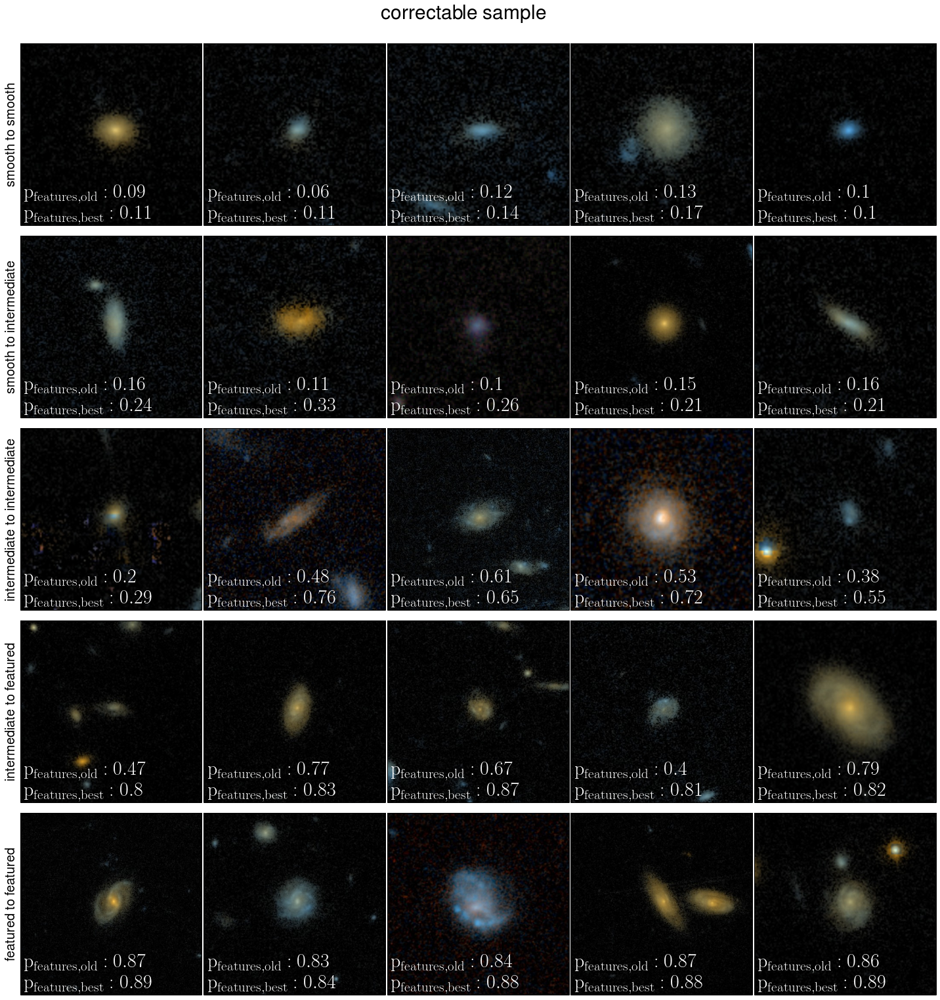

In [74]:
# Correctable Sample  
# 5 rows of 5 - smooth to smooth, smooth to int, int to int, int to featured, featured to featured 
gs=gridspec.GridSpec(5,5)
gs.update(wspace=0.01)
gs.update(hspace=0.05)
 
def int_list(table_data):
    ints = np.linspace(0,len(table_data),len(table_data)+1)
    ints = [int(s) for s in ints]
    random.shuffle(ints)
    return ints

# 5 types, shuffle lists    
s_s = data[smooth_to_smooth & correctable]
s_s_ints = int_list(s_s)

s_i = data[smooth_to_int & correctable]
s_i_ints = int_list(s_i)

i_i = data[int_to_int & correctable]
i_i_ints = int_list(i_i)

i_f = data[int_to_featured & correctable]
i_f_ints = int_list(i_f)

f_f = data[featured_to_featured & correctable]
f_f_ints = int_list(f_f)

# plot 
def plot_corrections(data,int_list,i):
    gal = data[int_list[i]]
    plt.imshow(get_image_from_url(gal['location']))
    plt.tick_params(labelbottom='off',labelleft='off')
    ax.annotate('$\mathrm{p_{features,old}: %s}$\n$\mathrm{p_{features,best}: %s}$'%(round(gal[p_features],2),round(gal[p_features_best],2)),fontsize=30,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

ls = 20

f=plt.figure(figsize=(25,26))
#smooth_to_smooth 
for i in range(0,5):
    ax = plt.subplot(gs[0,i])
    plot_corrections(s_s,s_s_ints,i)
    if i==0:
        plt.ylabel('smooth~to~smooth',fontsize=ls)
#smoooth_to_int
for i in range(0,5):
    ax = plt.subplot(gs[1,i])
    plot_corrections(s_i,s_i_ints,i)
    if i==0:
        plt.ylabel('smooth~to~intermediate',fontsize=ls)
#smoooth_to_int
for i in range(0,5):
    ax = plt.subplot(gs[2,i])
    plot_corrections(i_i,i_i_ints,i)
    if i==0:
        plt.ylabel('intermediate~to~intermediate',fontsize=ls)
#smoooth_to_int
for i in range(0,5):
    ax = plt.subplot(gs[3,i])
    plot_corrections(i_f,i_f_ints,i)
    if i==0:
        plt.ylabel('intermediate~to~featured',fontsize=ls)
#smoooth_to_int
for i in range(0,5):
    ax = plt.subplot(gs[4,i])
    plot_corrections(f_f,f_f_ints,i)
    if i==0:
        plt.ylabel('featured~to~featured',fontsize=ls)

f.text(.5,.92,'correctable sample', fontsize=30,ha='center')


## Same as above, but for the 'lower limit' sample; here $p_{features,best} = p_{features, lower limit}$. 

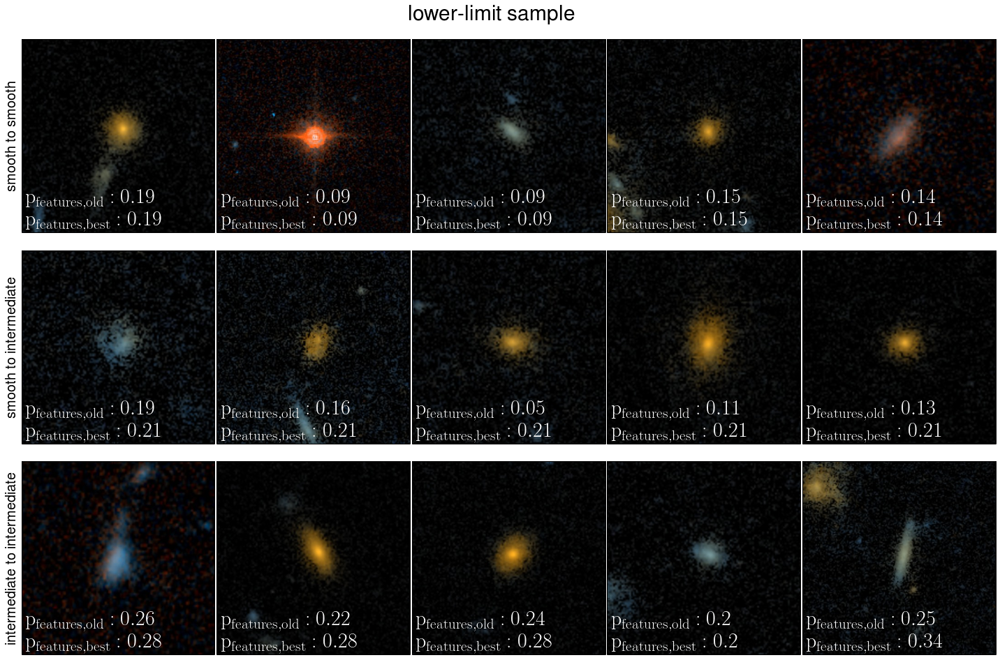

In [73]:
# Lower-limit Sample  
# 3 rows of 5 - smooth to smooth, smooth to int, int to int
gs=gridspec.GridSpec(3,5)
gs.update(wspace=0.01)
gs.update(hspace=0.05)
 
def int_list(table_data):
    ints = np.linspace(0,len(table_data),len(table_data)+1)
    ints = [int(s) for s in ints]
    random.shuffle(ints)
    return ints

# 5 types, shuffle lists    
s_s = data[smooth_to_smooth & ll]
s_s_ints = int_list(s_s)

s_i = data[smooth_to_int & ll]
s_i_ints = int_list(s_i)

i_i = data[int_to_int & ll]
i_i_ints = int_list(i_i)

i_f = data[int_to_featured & ll]
i_f_ints = int_list(i_f)

f_f = data[featured_to_featured & ll]
f_f_ints = int_list(f_f)

# plot 
def plot_corrections(data,int_list,i):
    gal = data[int_list[i]]
    plt.imshow(get_image_from_url(gal['location']))
    plt.tick_params(labelbottom='off',labelleft='off')
    ax.annotate('$\mathrm{p_{features,old}: %s}$\n$\mathrm{p_{features,best}: %s}$'%(round(gal[p_features],2),round(gal[p_features_best],2)),fontsize=30,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

ls = 20

f=plt.figure(figsize=(25,16))
#smooth_to_smooth 
for i in range(0,5):
    ax = plt.subplot(gs[0,i])
    plot_corrections(s_s,s_s_ints,i)
    if i==0:
        plt.ylabel('smooth~to~smooth',fontsize=ls)
#smoooth_to_int
for i in range(0,5):
    ax = plt.subplot(gs[1,i])
    plot_corrections(s_i,s_i_ints,i)
    if i==0:
        plt.ylabel('smooth~to~intermediate',fontsize=ls)
#smoooth_to_int
for i in range(0,5):
    ax = plt.subplot(gs[2,i])
    plot_corrections(i_i,i_i_ints,i)
    if i==0:
        plt.ylabel('intermediate~to~intermediate',fontsize=ls)

f.text(.5,.92,'lower-limit sample', fontsize=30,ha='center')



In [62]:
## debiased corrections for ll and nei sample - ie why we don't trust them 

deb_smooth_to_smooth = (data[p_features]<smooth_cut) & (data[p_features_debiased]<smooth_cut)
deb_smooth_to_int = (data[p_features]<smooth_cut) & (data[p_features_debiased]>smooth_cut) & (data[p_features_debiased] < disk_cut)
deb_smooth_to_featured = (data[p_features]<smooth_cut) & (data[p_features_debiased]>disk_cut)

deb_int_to_smooth = (data[p_features]>smooth_cut) & (data[p_features] < disk_cut) & (data[p_features_debiased]<smooth_cut)
deb_int_to_int = (data[p_features]>smooth_cut) & (data[p_features] < disk_cut) & (data[p_features_debiased]>smooth_cut) & (data[p_features_debiased] < disk_cut)
deb_int_to_featured = (data[p_features]>smooth_cut) & (data[p_features] < disk_cut) & (data[p_features_debiased]>disk_cut)

deb_featured_to_smooth = (data[p_features]>disk_cut) & (data[p_features_debiased]<smooth_cut)
deb_featured_to_int =  (data[p_features]>disk_cut) & (data[p_features_debiased]>smooth_cut) & (data[p_features_debiased] < disk_cut)
deb_featured_to_featured = (data[p_features]>disk_cut) & (data[p_features_debiased]>disk_cut)

In [63]:
## UNTRUSTWORTHY CORRECTIONS - lower limit sample
# Stats for lower_limit sample:

total_ll = len(data[ll])

print 'Correctable smooth to smooth: %s' %(len(data[deb_smooth_to_smooth & ll]))
print 'Correctable smooth to int: %s' %(len(data[deb_smooth_to_int & ll]))
print 'Correctable smooth to featured: %s \n' %(len(data[deb_smooth_to_featured & ll])) 
print 'Correctable int to smooth: %s' %(len(data[deb_int_to_smooth & ll]))
print 'Correctable int to int: %s' %(len(data[deb_int_to_int & ll]))
print 'Correctable int to featured: %s \n' %(len(data[deb_int_to_featured & ll]))
print 'Correctable featured to smooth: %s' %(len(data[deb_featured_to_smooth & ll]))
print 'Correctable featured to int: %s' %(len(data[deb_featured_to_int & ll]))
print 'Correctable featured to featured: %s \n' %(len(data[deb_featured_to_featured & ll]))

Correctable smooth to smooth: 42
Correctable smooth to int: 18193
Correctable smooth to featured: 0 

Correctable int to smooth: 0
Correctable int to int: 12118
Correctable int to featured: 0 

Correctable featured to smooth: 0
Correctable featured to int: 0
Correctable featured to featured: 0 



In [64]:
## UNTRUSTWORTHY CORRECTIONS - lower limit sample
# Stats for nei sample:

total_nei = len(data[nei])

print 'Correctable smooth to smooth: %s' %(len(data[deb_smooth_to_smooth & nei]))
print 'Correctable smooth to int: %s' %(len(data[deb_smooth_to_int & nei]))
print 'Correctable smooth to featured: %s \n' %(len(data[deb_smooth_to_featured & nei])) 
print 'Correctable int to smooth: %s' %(len(data[deb_int_to_smooth & nei]))
print 'Correctable int to int: %s' %(len(data[deb_int_to_int & nei]))
print 'Correctable int to featured: %s \n' %(len(data[deb_int_to_featured & nei]))
print 'Correctable featured to smooth: %s' %(len(data[deb_featured_to_smooth & nei]))
print 'Correctable featured to int: %s' %(len(data[deb_featured_to_int & nei]))
print 'Correctable featured to featured: %s \n' %(len(data[deb_featured_to_featured & nei]))

Correctable smooth to smooth: 1157
Correctable smooth to int: 6837
Correctable smooth to featured: 2720 

Correctable int to smooth: 0
Correctable int to int: 8906
Correctable int to featured: 19543 

Correctable featured to smooth: 0
Correctable featured to int: 0
Correctable featured to featured: 3224 



## Below: 'nei' sample. The z,mu space occupied these galaxies did not have FERENGI data, so no correction could be confidently derived. The catalog offers debiased vote fractions for these anyway, but we argue that these are not confident corrections and the best vote fraction is the uncorrected version. The example images here show the potential changes in morphology if the debiased vote fractions are used - it is apparent that several galaxies are boosted from smooth to featured when they should not be. 

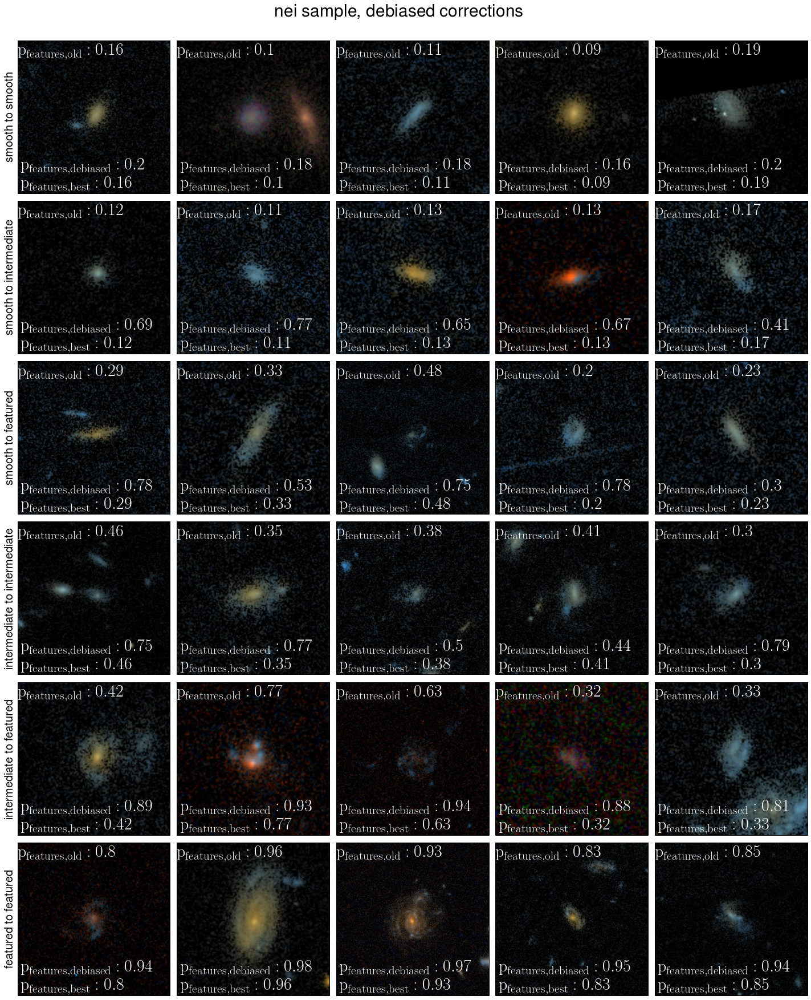

In [72]:
# nei Sample  
# 6 rows of 5 - smooth to smooth, smooth to int, smooth to featured, int to int, int to featured, featured to featured 
gs=gridspec.GridSpec(6,5)
gs.update(wspace=0.01)
gs.update(hspace=0.05)
 
def int_list(table_data):
    ints = np.linspace(0,len(table_data),len(table_data)+1)
    ints = [int(s) for s in ints]
    random.shuffle(ints)
    return ints

# 5 types, shuffle lists    
s_s = data[deb_smooth_to_smooth & nei]
s_s_ints = int_list(s_s)

s_i = data[deb_smooth_to_int & nei]
s_i_ints = int_list(s_i)

s_f = data[deb_int_to_int & nei]
s_f_ints = int_list(s_f)

i_i = data[deb_int_to_int & nei]
i_i_ints = int_list(i_i)

i_f = data[deb_int_to_featured & nei]
i_f_ints = int_list(i_f)

f_f = data[deb_featured_to_featured & nei]
f_f_ints = int_list(f_f)

# plot 
def plot_corrections(data,int_list,i):
    gal = data[int_list[i]]
    plt.imshow(get_image_from_url(gal['location']))
    plt.tick_params(labelbottom='off',labelleft='off')
    ax.annotate('$\mathrm{p_{features,old}: %s}$'%round(gal[p_features],2),fontsize=30,xy=(0,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

    ax.annotate('$\mathrm{p_{features,debiased}: %s}$\n$\mathrm{p_{features,best}: %s}$'%(round(gal[p_features_debiased],2),round(gal[p_features_best],2)),fontsize=30,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

ls = 20

f=plt.figure(figsize=(25,30))
#smooth_to_smooth 
for i in range(0,5):
    ax = plt.subplot(gs[0,i])
    plot_corrections(s_s,s_s_ints,i)
    if i==0:
        plt.ylabel('smooth~to~smooth',fontsize=ls)
#smoooth_to_int
for i in range(0,5):
    ax = plt.subplot(gs[1,i])
    plot_corrections(s_i,s_i_ints,i)
    if i==0:
        plt.ylabel('smooth~to~intermediate',fontsize=ls)
#smoooth_to_featured
for i in range(0,5):
    ax = plt.subplot(gs[2,i])
    plot_corrections(s_f,s_f_ints,i)
    if i==0:
        plt.ylabel('smooth~to~featured',fontsize=ls)
#int_to_int
for i in range(0,5):
    ax = plt.subplot(gs[3,i])
    plot_corrections(i_i,i_i_ints,i)
    if i==0:
        plt.ylabel('intermediate~to~intermediate',fontsize=ls)
#int_to_featured
for i in range(0,5):
    ax = plt.subplot(gs[4,i])
    plot_corrections(i_f,i_f_ints,i)
    if i==0:
        plt.ylabel('intermediate~to~featured',fontsize=ls)
#featured_to_featured
for i in range(0,5):
    ax = plt.subplot(gs[5,i])
    plot_corrections(f_f,f_f_ints,i)
    if i==0:
        plt.ylabel('featured~to~featured',fontsize=ls)
        
f.text(.5,.92,'nei sample, debiased corrections', fontsize=30,ha='center')
